In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/rsna-monai-packages/monai-0.6.0-202107081903-py3-none-any.whl
/kaggle/input/rsna-monai-packages/einops-0.3.0-py2.py3-none-any.whl
/kaggle/input/rsna-miccai-brain-tumor-radiogenomic-classification/sample_submission.csv
/kaggle/input/rsna-miccai-brain-tumor-radiogenomic-classification/train_labels.csv
/kaggle/input/rsna-miccai-brain-tumor-radiogenomic-classification/test/00114/T2w/Image-4.dcm
/kaggle/input/rsna-miccai-brain-tumor-radiogenomic-classification/test/00114/T2w/Image-2.dcm
/kaggle/input/rsna-miccai-brain-tumor-radiogenomic-classification/test/00114/T2w/Image-3.dcm
/kaggle/input/rsna-miccai-brain-tumor-radiogenomic-classification/test/00114/T2w/Image-5.dcm
/kaggle/input/rsna-miccai-brain-tumor-radiogenomic-classification/test/00114/T2w/Image-19.dcm
/kaggle/input/rsna-miccai-brain-tumor-radiogenomic-classification/test/00114/T2w/Image-16.dcm
/kaggle/input/rsna-miccai-brain-tumor-radiogenomic-classification/test/00114/T2w/Image-10.dcm
/kaggle/input/rsna-miccai-brain

In [3]:
pip install '../input/rsna-monai-packages/monai-0.6.0-202107081903-py3-none-any.whl'

Processing /kaggle/input/rsna-monai-packages/monai-0.6.0-202107081903-py3-none-any.whl
monai is already installed with the same version as the provided wheel. Use --force-reinstall to force an installation of the wheel.
Note: you may need to restart the kernel to use updated packages.


In [4]:
import pandas as pd
import numpy as np
from tqdm import tqdm
import os

import pydicom
from pydicom.pixel_data_handlers.util import apply_voi_lut

from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import roc_auc_score
import glob


In [6]:
!pip install -U albumentations


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.7/41.7 kB 1.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.0/66.0 kB 2.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 290.6/290.6 kB 7.4 MB/s eta 0:00:00:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 632.7/632.7 kB 15.2 MB/s eta 0:00:0000:01
  Attempting uninstall: albucore
    Found existing installation: albucore 0.0.19
    Uninstalling albucore-0.0.19:
      Successfully uninstalled albucore-0.0.19
  Attempting uninstall: albumentations
    Found existing installation: albumentations 1.4.20
    Uninstalling albumentations-1.4.20:
      Successfully uninstalled albumentations-1.4.20


In [7]:
import albumentations as A
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from albumentations.pytorch import ToTensorV2
from sklearn.metrics import roc_auc_score
from torch.optim import lr_scheduler
from tqdm import tqdm
import re

NUM_IMAGES_3D = 64
TRAINING_BATCH_SIZE = 8
TEST_BATCH_SIZE = 8
IMAGE_SIZE = 256
N_EPOCHS = 15
do_valid = True
n_workers = 4
type_ = "T1wCE"

In [8]:
import pydicom
import cv2

def load_dicom_image(path, img_size=IMAGE_SIZE, voi_lut=True, rotate=0):
    # Replace read_file() with dcmread() as the correct method
    dicom = pydicom.dcmread(path)
    
    # Extract pixel data from the DICOM file
    data = dicom.pixel_array
    
    # Apply VOI LUT if needed
    if voi_lut:
        from pydicom.pixel_data_handlers.util import apply_voi_lut
        data = apply_voi_lut(dicom.pixel_array, dicom)    
    # Rotate the image if a rotation angle is specified
    if rotate > 0:
        rot_choices = [
            0,
            cv2.ROTATE_90_CLOCKWISE,
            cv2.ROTATE_90_COUNTERCLOCKWISE,
            cv2.ROTATE_180,
        ]
        data = cv2.rotate(data, rot_choices[rotate])
    # Resize the image to the target size
    data = cv2.resize(data, (img_size, img_size))
    
    return data


In [9]:
import random

import cv2
from torch.utils.data import Dataset


class BrainRSNADataset(Dataset):
    def __init__(
        self, data, transform=None, target="MGMT_value", mri_type="FLAIR", is_train=True
    ):
        self.target = target
        self.data = data
        self.type = mri_type

        self.transform = transform
        self.is_train = is_train
        self.folder = "train" if self.is_train else "test"

    def __len__(self):
        return len(self.data)

    def __getitem__(self, index):
        row = self.data.loc[index]
        case_id = int(row.BraTS21ID)
        target = int(row[self.target])
        _3d_images = self.load_dicom_images_3d(case_id)
        _3d_images = torch.tensor(_3d_images).float()
        if self.is_train:
            return {"image": _3d_images, "target": target}
        else:
            return {"image": _3d_images, "case_id": case_id}

    def load_dicom_images_3d(
        self,
        case_id,
        num_imgs=NUM_IMAGES_3D,
        img_size=IMAGE_SIZE,
        rotate=0,
    ):
        case_id = str(case_id).zfill(5)

        path = f"../input/rsna-miccai-brain-tumor-radiogenomic-classification/{self.folder}/{case_id}/{self.type}/*.dcm"
        files = sorted(
            glob.glob(path),
            key=lambda var: [
                int(x) if x.isdigit() else x for x in re.findall(r"[^0-9]|[0-9]+", var)
            ],
        )

        middle = len(files) // 2
        num_imgs2 = num_imgs // 2
        p1 = max(0, middle - num_imgs2)
        p2 = min(len(files), middle + num_imgs2)
        image_stack = [load_dicom_image(f, rotate=rotate) for f in files[p1:p2]]
        
        img3d = np.stack(image_stack).T
        if img3d.shape[-1] < num_imgs:
            n_zero = np.zeros((img_size, img_size, num_imgs - img3d.shape[-1]))
            img3d = np.concatenate((img3d, n_zero), axis=-1)

        if np.min(img3d) < np.max(img3d):
            img3d = img3d - np.min(img3d)
            img3d = img3d / np.max(img3d)

        return np.expand_dims(img3d, 0)


In [11]:
ls ../input/

monai-v060-deep-learning-in-healthcare-imaging/
resnet10rsna/
rsna-miccai-brain-tumor-radiogenomic-classification/
rsna-monai-packages/


In [12]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("rinnqd/resnet10rsna")

print("Path to dataset files:", path)

Path to dataset files: /kaggle/input/d/rinnqd/resnet10rsna


In [13]:
import monai

# model 
model = monai.networks.nets.resnet10(spatial_dims=3, n_input_channels=1, n_classes=1)
device = torch.device("cuda")
model.to(device);
all_weights = os.listdir("../input/resnet10rsna")
fold_files = [f for f in all_weights if type_ in f]
criterion = nn.BCEWithLogitsLoss()

/usr/local/lib/python3.10/dist-packages/ignite/handlers/checkpoint.py:16: DeprecationWarning: `TorchScript` support for functional optimizers is deprecated and will be removed in a future PyTorch release. Consider using the `torch.compile` optimizer instead.
  from torch.distributed.optim import ZeroRedundancyOptimizer


In [14]:
fold_files

['3d-resnet10_T1wCE_fold2_0.538.pth',
 '3d-resnet10_T1wCE_fold0_0.565.pth',
 '3d-resnet10_T1wCE_fold4_0.551.pth',
 '3d-resnet10_T1wCE_fold1_0.573.pth',
 '3d-resnet10_T1wCE_fold3_0.664.pth']

In [15]:
sample = pd.read_csv("../input/rsna-miccai-brain-tumor-radiogenomic-classification/sample_submission.csv")

In [16]:
# Load the sample submission file
sample = pd.read_csv("../input/rsna-miccai-brain-tumor-radiogenomic-classification/sample_submission.csv")

# Get the first case ID from the sample submission file
first_case_id = sample.iloc[0]["BraTS21ID"]

# Convert to integer (if necessary)
first_case_id = int(first_case_id)

# Create an instance of BrainRSNADataset
dataset = BrainRSNADataset(data=sample, is_train=False)

# Load the 3D image for the first case ID
img3d = dataset.load_dicom_images_3d(first_case_id)

# Print the shape of the 3D array
print("Shape of 3D array:", img3d.shape)

Shape of 3D array: (1, 256, 256, 64)


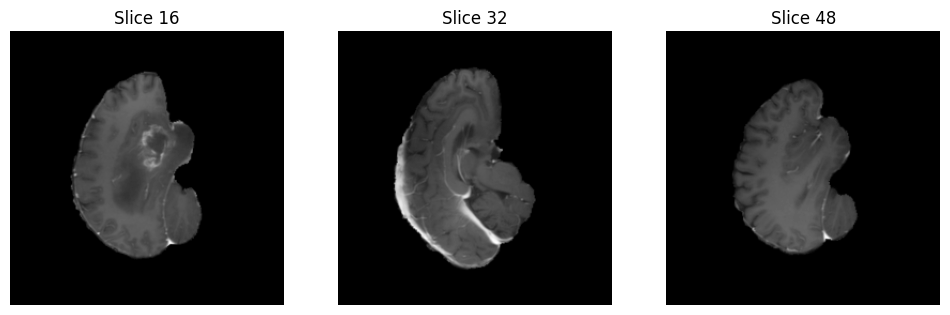

In [17]:
import matplotlib.pyplot as plt
import cv2
import numpy as np

# Load the sample submission file
sample = pd.read_csv("../input/rsna-miccai-brain-tumor-radiogenomic-classification/sample_submission.csv")

# Get the first case ID from the sample submission file
first_case_id = int(sample.iloc[0]["BraTS21ID"])

# Create an instance of BrainRSNADataset
dataset = BrainRSNADataset(data=sample, is_train=False, mri_type="T1wCE")

# Load the 3D image for the first case ID
img3d = dataset.load_dicom_images_3d(first_case_id)  # Shape: (1, 256, 256, 64)

# Remove extra dimension (Convert shape from (1, 256, 256, 64) to (256, 256, 64))
img3d = img3d[0]  

# Select some slices to visualize (e.g., middle slices)
num_slices = img3d.shape[-1]
slices_to_display = [num_slices // 4, num_slices // 2, (3 * num_slices) // 4]  # Select 3 slices

# Plot the selected slices
plt.figure(figsize=(12, 4))
for i, slice_idx in enumerate(slices_to_display):
    plt.subplot(1, len(slices_to_display), i + 1)
    plt.imshow(img3d[:, :, slice_idx], cmap="gray")  # Display the slice
    plt.title(f"Slice {slice_idx}")
    plt.axis("off")

plt.show()

In [18]:
#actual
import kagglehub

# Download latest version
path = kagglehub.dataset_download("mikecho/monai-v060-deep-learning-in-healthcare-imaging")

print("Path to dataset files:", path)

Path to dataset files: /kaggle/input/monai-v060-deep-learning-in-healthcare-imaging


In [24]:
# def Train(sample):
tta_true_labels = []
tta_preds = []
test_dataset = BrainRSNADataset(data=sample, mri_type=type_, is_train=False)
test_dl = torch.utils.data.DataLoader(
        test_dataset, batch_size=8, shuffle=False, num_workers=4
    )
preds_f = np.zeros(len(sample))
for fold in range(5):
    image_ids = []
    model.load_state_dict(torch.load(f"../input/resnet10rsna/{fold_files[fold]}", weights_only=True))
    preds = []
    epoch_iterator_test = tqdm(test_dl)
    with torch.no_grad():
        for  step, batch in enumerate(epoch_iterator_test):
            model.eval()
            images = batch["image"].to(device)

            outputs = model(images)
            preds.append(outputs.sigmoid().detach().cpu().numpy())
            image_ids.append(batch["case_id"].detach().cpu().numpy())
    

    preds_f += np.vstack(preds).T[0]/5

    ids_f = np.hstack(image_ids)


100%|██████████| 11/11 [00:14<00:00,  1.33s/it]


In [20]:
# Train(sample)

100%|██████████| 11/11 [00:14<00:00,  1.29s/it]


In [26]:
sample["BraTS21ID"] = ids_f
sample["MGMT_value"] = preds_f

In [39]:
sample = sample.sort_values(by="BraTS21ID").reset_index(drop=True)
Test_cases = sample.sample(n=5, random_state=42)

In [28]:
sample.to_csv("submission.csv", index=False)

In [29]:
sample


,BraTS21ID,MGMT_value
0,1,0.543903
1,13,0.551329
2,15,0.558354
3,27,0.552075
4,37,0.546816
...,...,...
82,826,0.457756
83,829,0.430671
84,833,0.502590
85,997,0.525566


In [30]:
# Create a new DataFrame without altering sample
chemo_results = sample[["BraTS21ID", "MGMT_value"]].copy()

# Rename columns
chemo_results.rename(columns={"BraTS21ID": "patient_id"}, inplace=True)

# Apply chemo decision
chemo_results["result"] = chemo_results["MGMT_value"].apply(lambda x: "Chemo Recommended" if x > 0.5 else "Chemotherapy not suitable")

# Save output
chemo_results[["patient_id", "result"]].to_csv("chemo_results.csv", index=False)

# Display output
print(chemo_results[["patient_id", "result"]])


    patient_id                     result
0            1          Chemo Recommended
1           13          Chemo Recommended
2           15          Chemo Recommended
3           27          Chemo Recommended
4           37          Chemo Recommended
..         ...                        ...
82         826  Chemotherapy not suitable
83         829  Chemotherapy not suitable
84         833          Chemo Recommended
85         997          Chemo Recommended
86        1006          Chemo Recommended

[87 rows x 2 columns]


In [33]:
# load Sample_submission.csv
sample_submission_df = pd.read_csv("../input/rsna-miccai-brain-tumor-radiogenomic-classification/sample_submission.csv")
# train_labels_df = pd.read_csv("../input/rsna-miccai-brain-tumor-radiogenomic-classification/train_labels.csv")
sample_submission_df = sample_submission_df.sort_values(by="BraTS21ID").reset_index(drop=True)

# Split 80-20 using NumPy
split_index = int(0.8 * len(sample_submission_df))
true_train_data, true_test_data = np.split(sample_submission_df, [split_index])

/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:59: FutureWarning: 'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.
  return bound(*args, **kwds)


In [32]:
sample_df = sample.sort_values(by="BraTS21ID").reset_index(drop=True)

# Split 80-20 using NumPy
split_index = int(0.8 * len(sample_df))
pred_train_data, pred_test_data = np.split(sample_df, [split_index])

/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:59: FutureWarning: 'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.
  return bound(*args, **kwds)


In [36]:
# Train Accuracy

from sklearn.metrics import accuracy_score

# Extract the true labels (MGMT_value column)
y_true = true_train_data["MGMT_value"].values  # Convert to numpy array
# print(y_true)

# Extract the predicted labels from your model (Make sure it's an array)
y_pred = pred_train_data["MGMT_value"].values  # If sample is a tensor, convert it: sample.numpy()
# print(y_pred)

# Compute Mean Absolute Error (MAE)
mae = np.mean(np.abs(y_true - y_pred))

# Compute Mean Squared Error (MSE)
mse = np.mean((y_true - y_pred) ** 2)

# Compute Root Mean Squared Error (RMSE)
rmse = np.sqrt(mse)

# Print results
print(f"MAE: {mae:.6f}")
print(f"MSE: {mse:.6f}")
print(f"RMSE: {rmse:.6f}")


print(f"Accuracy using MAE: {(1-mae)*100}")
print(f"Accuracy using MSA: {(1-mse)*100}")
print(f"Accuracy using RMSE: {(1-rmse)*100}")


MAE: 0.034934
MSE: 0.001750
RMSE: 0.041835
Accuracy using MAE: 96.50658616877121
Accuracy using MSA: 99.82498434392868
Accuracy using RMSE: 95.81651274567116


In [40]:
Test_cases

,BraTS21ID,MGMT_value
76,762,0.542362
0,1,0.543903
26,229,0.497925
22,190,0.493179
12,125,0.450465


In [46]:
base_dir = "/kaggle/input/testcases/Patients/Patients"


In [47]:
patients_data = []

# Loop through patient folders
for patient_id in sorted(os.listdir(base_dir)):  # Sorting to maintain order
    patient_path = os.path.join(base_dir, patient_id)

    if os.path.isdir(patient_path):  # Ensure it's a directory
        # Loop through subfolders (FLAIR, T1w, etc.)
        for scan_type in os.listdir(patient_path):
            scan_path = os.path.join(patient_path, scan_type)

            if os.path.isdir(scan_path):  # Ensure it's a directory
                # Loop through DICOM (.dcm) files
                for dicom_file in os.listdir(scan_path):
                    if dicom_file.endswith(".dcm"):  # Check if it's a DICOM file
                        dicom_path = os.path.join(scan_path, dicom_file)

                        # Load the DICOM file
                        dicom_data = pydicom.dcmread(dicom_path)

                        # Extract metadata (you can extract more fields as needed)
                        patients_data.append({
                            "patient_id": patient_id,
                            "scan_type": scan_type,
                            "dicom_file": dicom_file,
                            "pixel_array_shape": dicom_data.pixel_array.shape  # Image dimensions
                        })


In [51]:
#dont r
Test_cases=patients_data

In [45]:
# Create a new DataFrame without altering sample
Test_cases_op = Test_cases[["BraTS21ID", "MGMT_value"]].copy()

# Rename columns
Test_cases_op.rename(columns={"BraTS21ID": "patient_id"}, inplace=True)

# Apply chemo decision
Test_cases_op["result"] = Test_cases_op["MGMT_value"].apply(lambda x: "Chemo Recommended" if x > 0.5 else "Chemotherapy not suitable")

# Save output
Test_cases_op[["patient_id", "result"]].to_csv("Test_cases_op.csv", index=False)

In [44]:
# Convert DataFrame to NumPy array
data_array = Test_cases_op[["patient_id", "MGMT_value", "result"]].to_numpy()

# Loop through the NumPy array and print the output in the required format
for i, (patient_id, mgmt_value, result) in enumerate(data_array, start=1):
    print(f"TestCase{i} (Patient {patient_id} result)")
    print(f"MGMT value - {mgmt_value}")
    print(result)
    print()  # For spacing


TestCase1 (Patient 762 result)
MGMT value - 0.5423619225621223
Chemo Recommended

TestCase2 (Patient 1 result)
MGMT value - 0.543903037905693
Chemo Recommended

TestCase3 (Patient 229 result)
MGMT value - 0.4979252964258194
Chemotherapy not suitable

TestCase4 (Patient 190 result)
MGMT value - 0.4931792914867401
Chemotherapy not suitable

TestCase5 (Patient 125 result)
MGMT value - 0.45046495646238327
Chemotherapy not suitable



In [ ]:
import numpy as np
import pydicom
import os
import cv2

# Path to dataset folder (Update this path in Kaggle)
DATASET_PATH = "/kaggle/input/inputsdifferent"  

# Function to check if an image is a valid DICOM
def is_dicom(file_path):
    """Checks if a file is a valid DICOM image."""
    try:
        dicom_data = pydicom.dcmread(file_path)
        return dicom_data
    except:
        return None

# Function to check if a DICOM image is an MRI scan
def is_mri_scan(dicom_data, filename):
    """Detects if a DICOM image is an MRI scan based on pixel values in HU."""
    try:
        image = dicom_data.pixel_array.astype(np.float32)
        intercept = dicom_data.RescaleIntercept if "RescaleIntercept" in dicom_data else 0
        slope = dicom_data.RescaleSlope if "RescaleSlope" in dicom_data else 1
        hu_image = image * slope + intercept

        min_val, max_val = np.min(hu_image), np.max(hu_image)

        # MRI HU range (approximate)
        if -100 <= min_val <= 500 and 500 <= max_val <= 1500:
            return True
        return False
    except Exception as e:
        print(f"Error processing {filename}: {e}")
        return False

# Function to check image format (JPEG, PNG, etc.)
def get_image_format(file_path):
    """Detects the format of a non-DICOM image file."""
    try:
        img = cv2.imread(file_path)
        if img is not None:
            ext = file_path.split('.')[-1].upper()
            return ext
    except:
        pass
    return "Unknown"

# Main test function
def test_image_rejection(dataset_path):
    """Tests if images are valid MRI scans and labels others as invalid."""
    i = 6  # Start testcase counter here

    for file in os.listdir(dataset_path):
        file_path = os.path.join(dataset_path, file)
        dicom_data = is_dicom(file_path)

        if dicom_data:
            if is_mri_scan(dicom_data, file):
                print(f"testcase {i}: \n {file}:  MRI scan detected - Proceeding with inference.")
                print()
            else:
                print(f"testcase {i}: \n {file}:  Invalid Input - MRI data required (Detected format: DICOM - Non-MRI).")
                print()
        else:
            format_type = get_image_format(file_path)
            print(f"testcase {i}: \n {file}:  Invalid Input - MRI data required (Detected format: {format_type}).")
            print()
        if (i==12):
            i+=1
        else:
            i += 2  # Increment testcase number by 2

# Run the test
test_image_rejection(DATASET_PATH)

In [ ]:
import os
import pydicom
import cv2
import numpy as np

# Set dataset path
base_path = "/kaggle/input/diff-organs/differentorgans/"

# Function to classify DICOM images using metadata
def classify_dicom(dicom_path):
    try:
        ds = pydicom.dcmread(dicom_path, stop_before_pixels=True)

        # Extract metadata
        body_part = getattr(ds, 'BodyPartExamined', '').lower()
        study_desc = getattr(ds, 'StudyDescription', '').lower()
        series_desc = getattr(ds, 'SeriesDescription', '').lower()

        combined_text = f"{body_part} {study_desc} {series_desc}"

        # Identify organ
        if any(keyword in combined_text for keyword in ['heart', 'cardiac', 'chest']):
            return "Heart"
        elif any(keyword in combined_text for keyword in ['lung', 'thorax', 'pulmonary']):
            return "Lung"
        elif any(keyword in combined_text for keyword in ['spine', 'spinal', 'vertebra', 'lumbar', 'thoracic', 'cervical']):
            return "Spine"
        else:
            return "Unknown"
    except Exception as e:
        return f"Error: {str(e)}"

# Function to classify PNG/JPG images based on filename (Simple Method)
def classify_image(image_path):
    filename = os.path.basename(image_path).lower()
    
    if "heart" in filename:
        return "Heart"
    elif "lung" in filename:
        return "Lung"
    elif "spine" in filename:
        return "Spine"
    else:
        return "Unknown"

# Process all files in the dataset
def process_files():
    i = 7  # start from 7
    for filename in os.listdir(base_path):
        file_path = os.path.join(base_path, filename)
        
        if filename.lower().endswith(".dcm"):
            organ = classify_dicom(file_path)
        elif filename.lower().endswith((".png", ".jpg", ".jpeg")):
            organ = classify_image(file_path)
        else:
            organ = "Not Supported"
        
        print(f"test case{i} :\n{filename} ➝ not a brain scan!! it is {organ}scan!!expected brain scan\n")
        i += 2  # increment by 2

# Run classification
process_files()
